# Product Sales Forecasting



## Problem Statement :
Product sales forecasting aims to estimate the number of products a store will sell in the future, based on various influencing factors such as store type, location, regional characteristics, promotional activities, and temporal variations (such as holidays and seasons). This project focuses on developing a predictive model that uses historical sales data from different stores to forecast sales for upcoming periods.

Importing the required libraries for analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import warnings
from scipy.stats import mode
warnings.filterwarnings('ignore')
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error,mean_absolute_percentage_error

In [2]:
plt.rcParams["figure.figsize"] = (12, 6)

In [3]:
!gdown 1diwd1MjHGpmYLvar3HCoaF_QB7-bzWQh

Downloading...
From: https://drive.google.com/uc?id=1diwd1MjHGpmYLvar3HCoaF_QB7-bzWQh
To: /content/TRAIN.csv
100% 9.15M/9.15M [00:00<00:00, 42.6MB/s]


In [4]:
!gdown 1OXU3_Aiqa84RQ_7R3VP4SJvs3-35Jm1Z

Downloading...
From: https://drive.google.com/uc?id=1OXU3_Aiqa84RQ_7R3VP4SJvs3-35Jm1Z
To: /content/TEST_FINAL.csv
100% 871k/871k [00:00<00:00, 34.8MB/s]


In [5]:
df = pd.read_csv('TRAIN.csv')
df

,ID,Store_id,Store_Type,Location_Type,Region_Code,Date,Holiday,Discount,#Order,Sales
0,T1000001,1,S1,L3,R1,01-01-2018,1,Yes,9,7011.84
1,T1000002,253,S4,L2,R1,01-01-2018,1,Yes,60,51789.12
2,T1000003,252,S3,L2,R1,01-01-2018,1,Yes,42,36868.20
3,T1000004,251,S2,L3,R1,01-01-2018,1,Yes,23,19715.16
4,T1000005,250,S2,L3,R4,01-01-2018,1,Yes,62,45614.52
...,...,...,...,...,...,...,...,...,...,...
188335,T1188336,149,S2,L3,R2,31-05-2019,1,Yes,51,37272.00
188336,T1188337,153,S4,L2,R1,31-05-2019,1,No,90,54572.64
188337,T1188338,154,S1,L3,R2,31-05-2019,1,No,56,31624.56
188338,T1188339,155,S3,L1,R2,31-05-2019,1,Yes,70,49162.41


Data Description

1.	ID: Unique identifier for each record in the dataset.
2.	Store_id: Unique identifier for each store.
3.	Store_Type: Categorization of the store based on its type.
4.	Location_Type: Classification of the store's location (e.g., urban, suburban).
5.	Region_Code: Code representing the geographical region where the store is located.
6.	Date: The specific date on which the data was recorded.
7.	Holiday: Indicator of whether the date was a holiday (1: Yes, 0: No).
8.	Discount: Indicates whether a discount was offered on the given date (Yes/No).
9.	Order number: The number of orders received by the store on the specified day.
10.	Sales: Total sales amount for the store on the given day.


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188340 entries, 0 to 188339
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   ID             188340 non-null  object 
 1   Store_id       188340 non-null  int64  
 2   Store_Type     188340 non-null  object 
 3   Location_Type  188340 non-null  object 
 4   Region_Code    188340 non-null  object 
 5   Date           188340 non-null  object 
 6   Holiday        188340 non-null  int64  
 7   Discount       188340 non-null  object 
 8   #Order         188340 non-null  int64  
 9   Sales          188340 non-null  float64
dtypes: float64(1), int64(3), object(6)
memory usage: 14.4+ MB


In [7]:
df.shape

(188340, 10)

In [8]:
#Formating the data type
df['Date'] = pd.to_datetime(df['Date'],format='mixed')
df['Discount'] = df['Discount'].map({'Yes':1,'No':0})

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188340 entries, 0 to 188339
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   ID             188340 non-null  object        
 1   Store_id       188340 non-null  int64         
 2   Store_Type     188340 non-null  object        
 3   Location_Type  188340 non-null  object        
 4   Region_Code    188340 non-null  object        
 5   Date           188340 non-null  datetime64[ns]
 6   Holiday        188340 non-null  int64         
 7   Discount       188340 non-null  int64         
 8   #Order         188340 non-null  int64         
 9   Sales          188340 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(4), object(4)
memory usage: 14.4+ MB


### Feature Engineering

In [10]:
data = df.copy()

In [11]:
# Function to Create Time Related Features
def create_date_features(df):
    df.rename(columns={'Date': 'date'}, inplace=True)
    df['day'] = df.date.dt.day.astype("int8")
    df['month'] = df.date.dt.month.astype("int8")
    df['day_of_month'] = df.date.dt.day.astype("int8")
    df['day_of_year'] = df.date.dt.dayofyear.astype("int16")
    df['week_of_month'] = (df.date.apply(lambda d: (d.day-1) // 7 + 1)).astype("int8")
    df['week_of_year'] = (df.date.dt.isocalendar().week).astype("int8")
    df['day_of_week'] = (df.date.dt.dayofweek + 1).astype("int8")
    df['year'] = df.date.dt.year.astype("int32")
    df["is_wknd"] = (df.date.dt.weekday // 4).astype("int8")
    df["quarter"] = df.date.dt.quarter.astype("int8")
    # 0: Winter - 1: Spring - 2: Summer - 3: Fall
    df["season"] = np.where(df.month.isin([12,1,2]), 0, 1)
    df["season"] = np.where(df.month.isin([6,7,8]), 2, df["season"])
    df["season"] = pd.Series(np.where(df.month.isin([9, 10, 11]), 3, df["season"])).astype("int8")
    return df

data = create_date_features(data)

In [12]:
#past 7 days sales

data['past_7_days_sales'] = data.groupby('Store_id')['Sales'].transform(lambda x: x.rolling(window=7, min_periods=1).sum())

In [13]:
data.groupby(['Store_id','date']).head(10)

,ID,Store_id,Store_Type,Location_Type,Region_Code,date,Holiday,Discount,#Order,Sales,...,day_of_month,day_of_year,week_of_month,week_of_year,day_of_week,year,is_wknd,quarter,season,past_7_days_sales
0,T1000001,1,S1,L3,R1,2018-01-01,1,1,9,7011.84,...,1,1,1,1,1,2018,0,1,0,7011.84
1,T1000002,253,S4,L2,R1,2018-01-01,1,1,60,51789.12,...,1,1,1,1,1,2018,0,1,0,51789.12
2,T1000003,252,S3,L2,R1,2018-01-01,1,1,42,36868.20,...,1,1,1,1,1,2018,0,1,0,36868.20
3,T1000004,251,S2,L3,R1,2018-01-01,1,1,23,19715.16,...,1,1,1,1,1,2018,0,1,0,19715.16
4,T1000005,250,S2,L3,R4,2018-01-01,1,1,62,45614.52,...,1,1,1,1,1,2018,0,1,0,45614.52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188335,T1188336,149,S2,L3,R2,2019-05-31,1,1,51,37272.00,...,31,151,5,22,5,2019,1,2,1,249249.00
188336,T1188337,153,S4,L2,R1,2019-05-31,1,0,90,54572.64,...,31,151,5,22,5,2019,1,2,1,589016.64
188337,T1188338,154,S1,L3,R2,2019-05-31,1,0,56,31624.56,...,31,151,5,22,5,2019,1,2,1,285397.56
188338,T1188339,155,S3,L1,R2,2019-05-31,1,1,70,49162.41,...,31,151,5,22,5,2019,1,2,1,347110.41


In [14]:
orders_per_store= data.groupby('Store_id')['#Order'].value_counts().groupby('Store_id').count()
data['avg_orders_per_store'] = orders_per_store.mean()

## EDA

### Sales Distribution

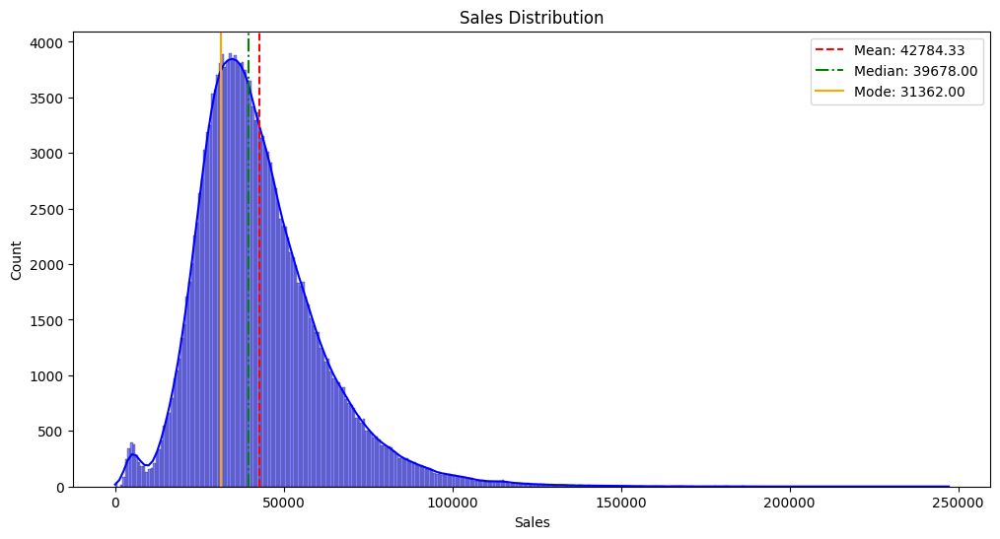

In [15]:
sales_data = df['Sales'].astype(float)

mean_value = np.mean(sales_data)
median_value = np.median(sales_data)
mode_result = mode(sales_data)
mode_value = mode_result.mode if mode_result.mode.size > 0 else None

sns.histplot(data=df, x='Sales', kde=True, color='blue')
plt.title('Sales Distribution')
plt.xlabel('Sales')
plt.ylabel('Count')

# Highlight Mean
plt.axvline(mean_value, color='red', linestyle='--', linewidth=1.5, label=f'Mean: {mean_value:.2f}')
# Highlight Median
plt.axvline(median_value, color='green', linestyle='-.', linewidth=1.5, label=f'Median: {median_value:.2f}')
# Highlight Mode
plt.axvline(mode_value, color='orange', linestyle='-', linewidth=1.5, label=f'Mode: {mode_value:.2f}')

plt.legend()

plt.show()

**Inference** : The sales distribution is highly skewed to the right, indicating that a majority of sales transactions have lower values, while a smaller number of transactions have significantly higher values.

### Sales Distribution w.r.t Categories

<Figure size 1000x600 with 0 Axes>

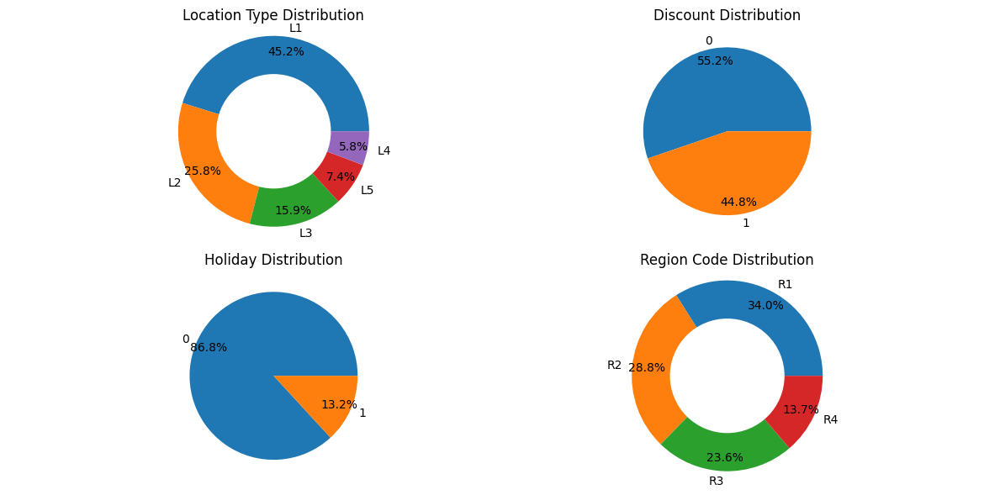

In [16]:
plt.figure(figsize=(10, 6))
centre_circle = plt.Circle((0, 0), 0.60, fc='white')
centre_circle1 = plt.Circle((0, 0), 0.60, fc='white')
fig,ax = plt.subplots(2,2)
ax[0,0].pie( df['Location_Type'].value_counts(),
    labels=df['Location_Type'].value_counts().index,
    autopct='%1.1f%%',
    pctdistance=0.85)
ax[0,0].set_title('Location Type Distribution')
ax[0,0].add_artist(centre_circle)
ax[0,0].axis('equal')


ax[0,1].pie(df['Discount'].value_counts(),labels = df['Discount'].value_counts().index ,autopct='%1.1f%%', pctdistance=0.85)
ax[0,1].set_title('Discount Distribution')

ax[1,0].pie(df['Holiday'].value_counts(),labels = df['Holiday'].value_counts().index ,autopct='%1.1f%%', pctdistance=0.85)
ax[1,0].set_title('Holiday Distribution')


ax[1,1].pie(df['Region_Code'].value_counts(),labels = df['Region_Code'].value_counts().index,autopct='%1.1f%%', pctdistance=0.85)
ax[1,1].set_title('Region Code Distribution')
ax[1,1].add_artist(centre_circle1)
ax[1,1].axis('equal')

plt.tight_layout()
plt.show()

**Inference** :
  *  Location Type L1 and Region Code R1 are dominant, indicating a high sales  in these categories.
  * Most sales occur during non-holiday periods and without discounts, suggesting a business model that does not rely heavily on promotions or holiday campaigns.
  * Lesser-represented categories (L4, L5, and R4) might need further investigation to determine their lower sales.

### Holiday v/s Non Holiday Sales

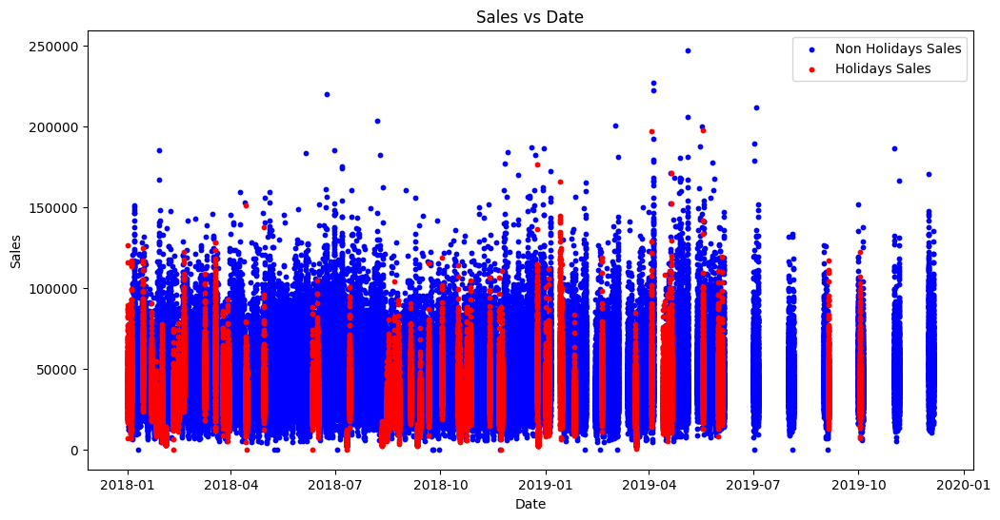

In [17]:
cond1 = (df['Holiday'] == 0)
cond2 = (df['Holiday'] == 1)
plt.scatter(df[cond1]['Date'],df[cond1]['Sales'],label='Non Holidays Sales', marker='o', s=10, color='blue')
plt.scatter(df[cond2]['Date'],df[cond2]['Sales'],label='Holidays Sales', marker='o', s=10, color='red')

plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Sales vs Date')
plt.legend()
plt.show()

Inference
* Sales during non-holiday periods (blue) are consistently distributed and generally higher than holiday sales.
* Sales during holiday periods (red) are less frequent and exhibit lower values in most instances.
* Non-holidays show a more uniform and dense spread, with occasional spikes in sales.
* Holidays have sporadic occurrences with lower density, indicating fewer holidays compared to non-holidays in the dataset.

### Store Type v/s Sales

In [18]:
px.box(df,x = 'Store_Type',y = 'Sales',color = 'Store_Type')

**Inference** : Median Sales of store type 4 is high while that of store type 2 is lowest

### Weekly Sales Distribution

In [19]:
px.box(data,x='day_of_week',y='Sales',color='day_of_week',title='Weekly Sales Distribution')

**Inference** : The avg number of sales is almost same for the 1st 4 days and drops on day 5 and then increases over the weekend. The median sales over the weekend is high

### Daily Sales

In [20]:
px.box(data,y ='Sales',x='day',color = 'day')

**Inference** : From the below graph we can observe that the 1st day of the month has the highest median sales

### Store Type Distribution

Text(0, 0.5, 'Count')

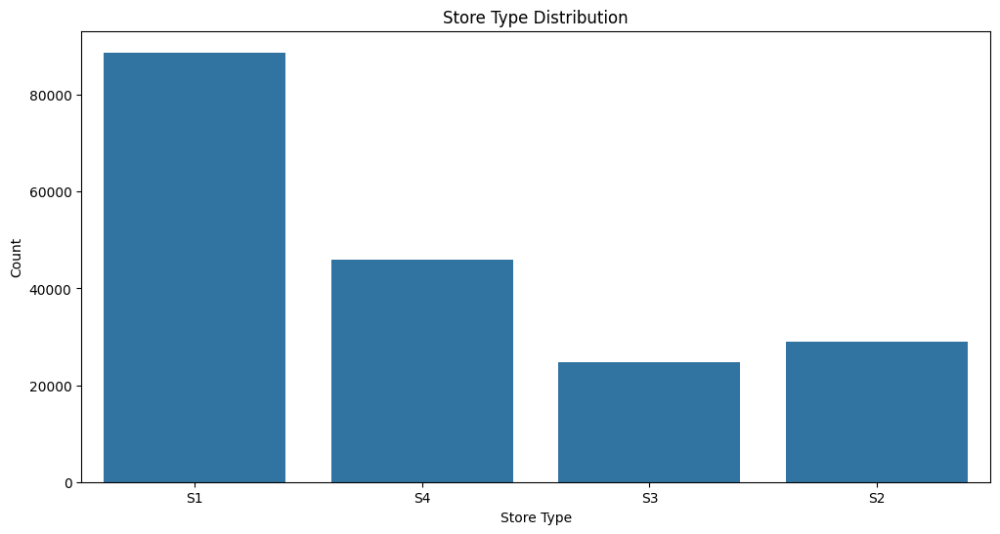

In [21]:
sns.countplot(data = df,x = 'Store_Type')
plt.title('Store Type Distribution')
plt.xlabel('Store Type')
plt.ylabel('Count')

**Inference** : Store type S1 has the highest count, followed by S4, then S2, with S3 having the lowest count.

### Monthly Sales

<Axes: xlabel='month', ylabel='Sales'>

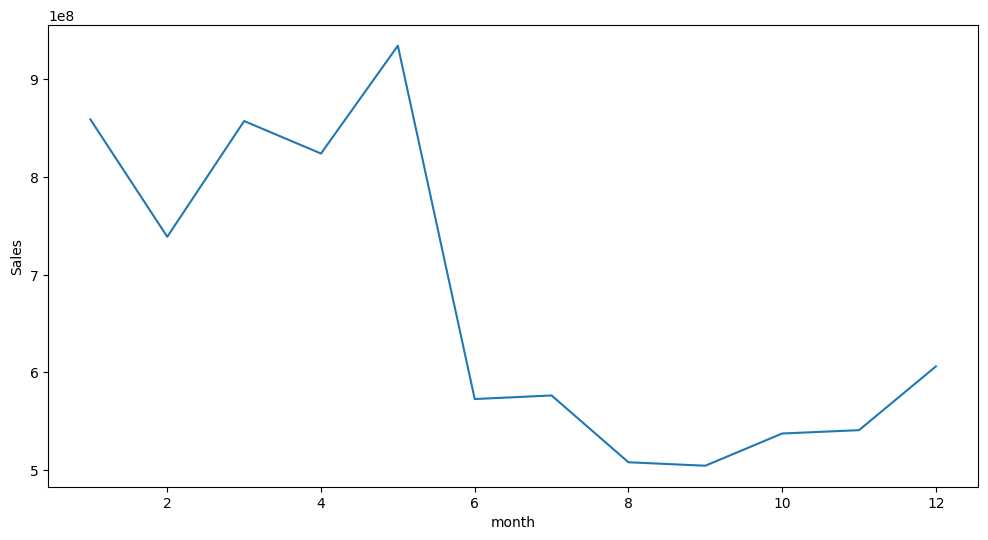

In [22]:
df_month = data.groupby('month')['Sales'].sum().reset_index()
sns.lineplot(df_month,x='month',y='Sales')

**Inference** :
* Sales during the first four months (January to April) show minor fluctuations, maintaining a relatively consistent level.
* The highest sales occur in the middle of the year, specifically around month 5 (May) or month 6 (June), with a sharp peak.
* After reaching the peak, there is a steep decline in sales between months 6 and 8 (June to August).
* Sales hit their lowest point around month 9 (September).
* After month 9, there is a gradual increase in sales toward the end of the year, with a notable upward trend from months 10 to 12 (October to December).



### Regions v/s Sales

In [23]:
px.box(df,x = 'Region_Code',y = 'Sales',color = 'Region_Code')

**Inference** :
* All regions have a comparable median sales value, indicating consistency across regions in central tendencies.
* R1 and R3 show a broader IQR compared to R2 and R4, indicating more variability in sales for these regions.
* All regions, especially R1 and R2, exhibit a significant number of outliers, representing exceptionally high sales values.
* R1 has the highest maximum outlier, reaching over 250k sales.
* R1 demonstrates the highest range of sales (including outliers), indicating it might have more high-performing instances than other regions.

### Checking for Unique Values

In [24]:
dfn = df.copy()

def dist_check(df, col_name):
  print("Unique values : ", df[col_name].unique())
  print("Value counts : ")
  print(df[col_name].value_counts())


col_list = ['Location_Type','Region_Code','Discount','Holiday','Store_Type']
for col in col_list:
  print(col, " -")
  dist_check(dfn, col)
  print("\n")

Location_Type  -
Unique values :  ['L3' 'L2' 'L1' 'L5' 'L4']
Value counts : 
Location_Type
L1    85140
L2    48504
L3    29928
L5    13932
L4    10836
Name: count, dtype: int64


Region_Code  -
Unique values :  ['R1' 'R4' 'R2' 'R3']
Value counts : 
Region_Code
R1    63984
R2    54180
R3    44376
R4    25800
Name: count, dtype: int64


Discount  -
Unique values :  [1 0]
Value counts : 
Discount
0    104051
1     84289
Name: count, dtype: int64


Holiday  -
Unique values :  [1 0]
Value counts : 
Holiday
0    163520
1     24820
Name: count, dtype: int64


Store_Type  -
Unique values :  ['S1' 'S4' 'S3' 'S2']
Value counts : 
Store_Type
S1    88752
S4    45924
S2    28896
S3    24768
Name: count, dtype: int64




### Checking Outliers

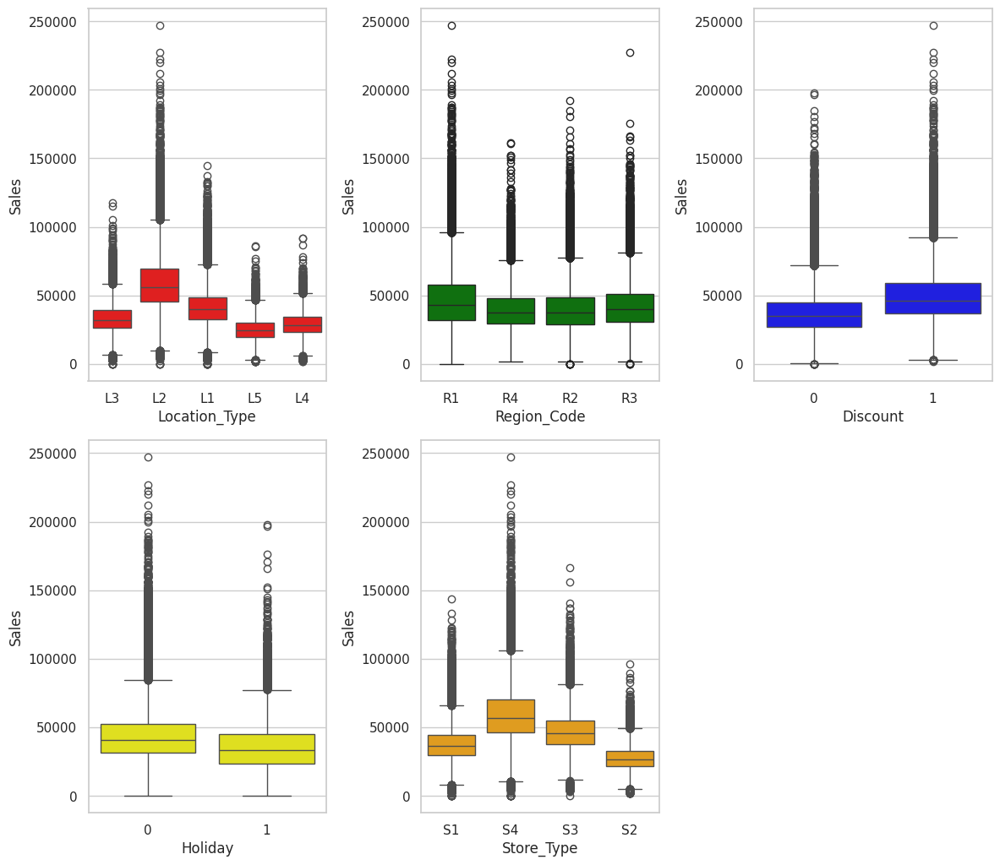

In [25]:
sns.set(style="whitegrid")
fig = plt.figure(figsize=(12, 15))
fig.subplots_adjust(right=1.5)
color = ['red','green','blue','yellow','orange']
i=0
for plot in range(1, len(col_list)+1):
    plt.subplot(3, 3, plot)
    sns.boxplot(x=dfn[col_list[plot-1]], y=dfn['Sales'],color = color[i])
    plt.tight_layout()
    i+=1

plt.show()

### Correlation Check

<Axes: >

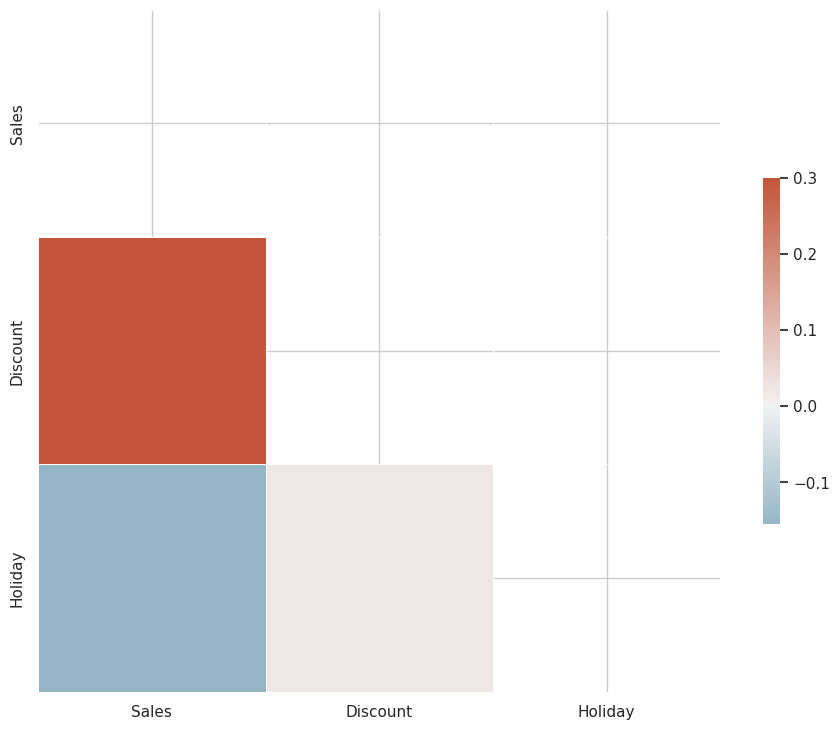

In [26]:
df_corr = df[['Sales','Discount','Holiday']]
corr = df_corr.corr()

mask = np.triu(np.ones_like(corr, dtype=bool))

f, ax = plt.subplots(figsize=(11, 9))

cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

 **Inference**

 * Discount has the strongest positive correlation with Sales.This suggests that when discounts are offered, sales tend to increase.
 * Holiday has a weaker positive correlation with Sales. This indicates that holidays generally have a positive impact on sales, but the effect is not as strong as discounts.

### Variation of Sales w.r.t to Date

Text(0, 0.5, 'Sales')

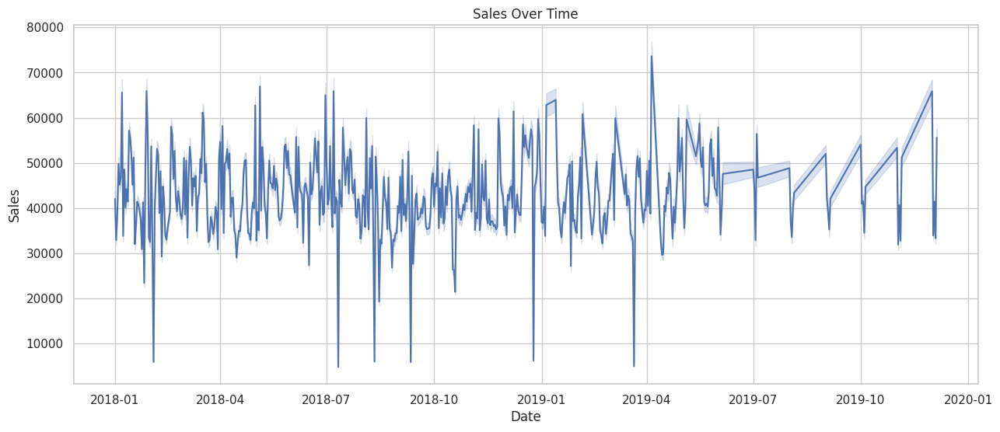

In [27]:
plt.figure(figsize=(15, 6))
sns.lineplot(x = df['Date'],y = df['Sales'])
plt.title('Sales Over Time')
plt.xlabel('Date')
plt.ylabel('Sales')

**Inference** : Sales fluctuate considerably throughout the period  (2018-2020), with a noticeable upward trend starting around mid-2019 and culminating in a peak near the beginning of 2020.

### Seasonal Sales

Text(0, 0.5, 'Sales')

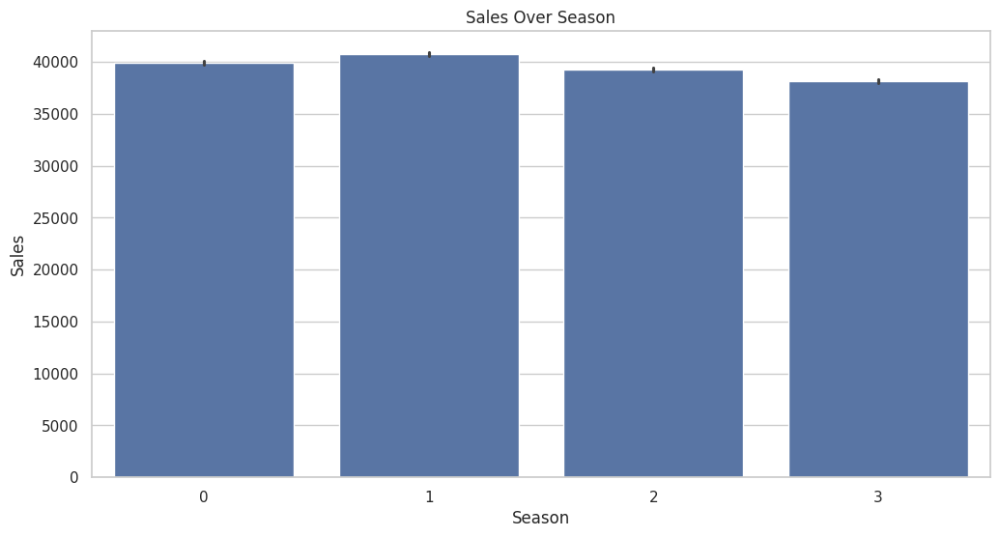

In [28]:
sns.barplot(x = data['season'],y = data['Sales'],estimator = "median")
plt.title('Sales Over Season')
plt.xlabel('Season')
plt.ylabel('Sales')

Inference :
* The sales values for all four seasons are quite close to each other, indicating no significant variation or seasonality effect in the sales data.
* Season 1 appears to have slightly higher sales than the others, but the difference is minimal.
* Season 3 has slightly lower sales compared to the rest.
* This indicates that sales remain consistent throughout the year, suggesting that the business might not rely heavily on specific seasonal factors to drive sales.

## Hypothesis Testing

Importing the required Libraries

In [29]:
from scipy.stats import ttest_1samp,ttest_ind,f_oneway,chi2_contingency,kruskal

#### Impact of Discount on Sales

In [30]:
#H0: Stores offering discounts will not have significantly higher sales than stores not offering discounts
#Ha: Stores offering discounts will have significantly higher sales than stores not offering discounts

with_discount = df[df['Discount']==0]['Sales'].values
without_discount = df[df['Discount']==1]['Sales'].values
print(f'Variance with Discount {np.var(with_discount,ddof=1)}')
print(f'Variance without Discount {np.var(without_discount,ddof=1)}')
tstatic,pvalue = ttest_ind(with_discount,without_discount,equal_var=False)
print('')
print(f' T-statistic :{tstatic}\n P-value : {pvalue}')
print('')
if pvalue < 0.05:
    print("Reject the null hypothesis: There is a significant difference in mean sales.")
else:
    print("Fail to reject the null hypothesis: No significant difference in mean sales.")

Variance with Discount 257267330.46650174
Variance without Discount 363728087.0566668

 T-statistic :-145.92946158629138
 P-value : 0.0

Reject the null hypothesis: There is a significant difference in mean sales.


#### Effect of Holidays on Sales

In [31]:
#H0 : Sales on holidays are lower than sales on non holidays
#Ha : Sales on holidays are higher than sales on non holidays
with_holiday = df[df['Holiday']==1]['Sales'].values
without_holiday = df[df['Holiday']==0]['Sales'].values

print(f'Variance with Holiday {np.var(with_holiday,ddof=1)}')
print(f'Variance without Holiday {np.var(without_holiday,ddof=1)}')
tstatic,pvalue = ttest_ind(with_holiday,without_holiday,equal_var=False)
print(f' T-statistic :{tstatic}\n P-value : {pvalue}')

if pvalue < 0.05:
    print("Reject the null hypothesis: There is a significant difference in mean sales.")
else:
    print("Fail to reject the null hypothesis: No significant difference in mean sales.")

Variance with Holiday 354280204.229235
Variance without Holiday 329183907.6997402
 T-statistic :-66.1757648298698
 P-value : 0.0
Reject the null hypothesis: There is a significant difference in mean sales.


In [32]:
# Annova
groups = [group['Sales'].values for _, group in df.groupby('Holiday')]

f_value, p_value = f_oneway(*groups)

print("F-value:", f_value)
print("P-value:", p_value)

if p_value < 0.05:
    print("Reject the null hypothesis: At least one group mean is significantly different.")
else:
    print("Fail to reject the null hypothesis: No significant difference among group means.")

F-value: 4622.656070661055
P-value: 0.0
Reject the null hypothesis: At least one group mean is significantly different.


### Sales Differences Across Store Types

In [33]:
#H0:Different store types experience the same sales volumes.
#Ha:Different store types experience different sales volumes.

st_groups = [group['Sales'].values for _, group in df.groupby('Store_Type')]

f_value, p_value = f_oneway(*st_groups)

print("F-value:", f_value)
print("P-value:", p_value)

if p_value < 0.05:
    print("Reject the null hypothesis: At least one group mean is significantly different.")
else:
    print("Fail to reject the null hypothesis: No significant difference among group means.")

F-value: 35123.64411601774
P-value: 0.0
Reject the null hypothesis: At least one group mean is significantly different.


### Regional Sales Variability

In [34]:
#H0 : There is no significant variability in sales across different regions
#Ha : There is significant variability in sales across different regions

groups = [group['Sales'].values for _, group in df.groupby('Region_Code')]

f_value, p_value = f_oneway(*groups)

print("F-value:", f_value)
print("P-value:", p_value)

if p_value < 0.05:
    print("Reject the null hypothesis: At least one group mean is significantly different.")
else:
    print("Fail to reject the null hypothesis: No significant difference among group means.")

F-value: 1682.4255287950675
P-value: 0.0
Reject the null hypothesis: At least one group mean is significantly different.


In [35]:
stat, p_value = kruskal(*groups)
print("Kruskal-Wallis Test: Statistic =", stat, ", p-value =", p_value)

if p_value < 0.05:
    print("Reject the null hypothesis: At least one group mean is significantly different.")
else:
    print("Fail to reject the null hypothesis: No significant difference among group means.")

Kruskal-Wallis Test: Statistic = 3968.0635904606884 , p-value = 0.0
Reject the null hypothesis: At least one group mean is significantly different.


### Correlation Between Orders Number and Sales

In [36]:
from scipy.stats import pearsonr, spearmanr

In [37]:
#H0 : A higher number of order does not correlates with higher sales.
#Ha : A higher number of order correlates with higher sales.

# Pearson Correlation
pearson_corr, pearson_p = pearsonr(df['#Order'], df['Sales'])
print("Pearson Correlation:", pearson_corr, "p-value:", pearson_p)

# Spearman Correlation
spearman_corr, spearman_p = spearmanr(df['#Order'], df['Sales'])
print("Spearman Correlation:", spearman_corr, "p-value:", spearman_p)


if pearson_p < 0.05:
    print("Pearson: Significant correlation")
else:
    print("Pearson: No significant correlation")

if spearman_p < 0.05:
    print("Spearman: Significant correlation")
else:
    print("Spearman: No significant correlation")

# Both the correaltion methods showcase significant correlation among order number and sales

Pearson Correlation: 0.9416005646125761 p-value: 0.0
Spearman Correlation: 0.9377462542115423 p-value: 0.0
Pearson: Significant correlation
Spearman: Significant correlation


## Ml Modeling

### Data Preprocessing

In [38]:
data

,ID,Store_id,Store_Type,Location_Type,Region_Code,date,Holiday,Discount,#Order,Sales,...,day_of_year,week_of_month,week_of_year,day_of_week,year,is_wknd,quarter,season,past_7_days_sales,avg_orders_per_store
0,T1000001,1,S1,L3,R1,2018-01-01,1,1,9,7011.84,...,1,1,1,1,2018,0,1,0,7011.84,79.90411
1,T1000002,253,S4,L2,R1,2018-01-01,1,1,60,51789.12,...,1,1,1,1,2018,0,1,0,51789.12,79.90411
2,T1000003,252,S3,L2,R1,2018-01-01,1,1,42,36868.20,...,1,1,1,1,2018,0,1,0,36868.20,79.90411
3,T1000004,251,S2,L3,R1,2018-01-01,1,1,23,19715.16,...,1,1,1,1,2018,0,1,0,19715.16,79.90411
4,T1000005,250,S2,L3,R4,2018-01-01,1,1,62,45614.52,...,1,1,1,1,2018,0,1,0,45614.52,79.90411
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188335,T1188336,149,S2,L3,R2,2019-05-31,1,1,51,37272.00,...,151,5,22,5,2019,1,2,1,249249.00,79.90411
188336,T1188337,153,S4,L2,R1,2019-05-31,1,0,90,54572.64,...,151,5,22,5,2019,1,2,1,589016.64,79.90411
188337,T1188338,154,S1,L3,R2,2019-05-31,1,0,56,31624.56,...,151,5,22,5,2019,1,2,1,285397.56,79.90411
188338,T1188339,155,S3,L1,R2,2019-05-31,1,1,70,49162.41,...,151,5,22,5,2019,1,2,1,347110.41,79.90411


In [39]:
data.isnull().sum()

,0
ID,0
Store_id,0
Store_Type,0
Location_Type,0
Region_Code,0
date,0
Holiday,0
Discount,0
#Order,0
Sales,0


In [40]:
data.duplicated().sum()

0

In [41]:
data.Store_Type.unique()

array(['S1', 'S4', 'S3', 'S2'], dtype=object)

In [42]:
data.Location_Type.unique()

array(['L3', 'L2', 'L1', 'L5', 'L4'], dtype=object)

In [43]:
data.Region_Code.unique()

array(['R1', 'R4', 'R2', 'R3'], dtype=object)

In [44]:
data.Holiday.unique()

array([1, 0])

In [45]:
data.Discount.value_counts()

,count
Discount,
0,104051
1,84289


In [46]:
data['#Order'].unique()

array([  9,  60,  42,  23,  62,  39,  40,  64,  87,  36,  69,  51,  56,
        59,  35,  29,  55,  46,  63,  78,  48,  38,  75,  91,  49,  26,
        68,  27,  25,  37,  45,  94,  53,  73,  31,  89,  66,  74,  47,
        77,  81,  21,  41,  61,  58, 118,  44, 121,  32,  83,  67,  52,
        34,  80,  57,  54,  50,  71,  92,  76, 111,  90,  43,  72,  70,
        84, 132,  24,  88,  65,  97, 113,  30,  33,  79, 108, 154,  28,
        85, 102, 115, 125, 180,  86,  96,  98, 119, 100, 142, 117, 146,
       145, 106, 112, 124, 107, 152, 103,  99, 189, 123, 135, 126,  93,
       130, 116, 167,  82, 181, 122, 120, 104, 109, 101, 128, 105, 138,
       169, 150, 137, 133, 110,  95, 170, 157, 156, 144, 196, 131, 209,
       143, 136, 140, 158, 139, 184, 129, 114, 201, 134, 217, 166,  15,
       177,  16, 147,  12,  17,  22,  13, 155, 127, 172, 168, 160, 174,
       151, 159, 165, 141,  20,  19, 149, 164,  18, 163,  11, 161, 183,
       178, 153, 185, 176, 192, 162, 202, 148, 193, 199, 219, 19

In [47]:
d = data.copy()

#### Outlier Treatment

In [48]:
#Outlier treatment

Q1 = d['Sales'].quantile(0.25)
Q3 = d['Sales'].quantile(0.75)
IQR = Q3 - Q1

# Define thresholds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Detect outliers
outliers = (d['Sales'] < lower_bound) | (d['Sales'] > upper_bound)

# Replace outliers with NaN
d.loc[outliers, 'Sales'] = np.nan

# Optionally, fill NaN values (e.g., linear interpolation)
d['Sales'] = d['Sales'].interpolate()

d.head()

,ID,Store_id,Store_Type,Location_Type,Region_Code,date,Holiday,Discount,#Order,Sales,...,day_of_year,week_of_month,week_of_year,day_of_week,year,is_wknd,quarter,season,past_7_days_sales,avg_orders_per_store
0,T1000001,1,S1,L3,R1,2018-01-01,1,1,9,7011.84,...,1,1,1,1,2018,0,1,0,7011.84,79.90411
1,T1000002,253,S4,L2,R1,2018-01-01,1,1,60,51789.12,...,1,1,1,1,2018,0,1,0,51789.12,79.90411
2,T1000003,252,S3,L2,R1,2018-01-01,1,1,42,36868.20,...,1,1,1,1,2018,0,1,0,36868.20,79.90411
3,T1000004,251,S2,L3,R1,2018-01-01,1,1,23,19715.16,...,1,1,1,1,2018,0,1,0,19715.16,79.90411
4,T1000005,250,S2,L3,R4,2018-01-01,1,1,62,45614.52,...,1,1,1,1,2018,0,1,0,45614.52,79.90411


Observing Sales post Outlier treatment

<Axes: xlabel='date', ylabel='Sales'>

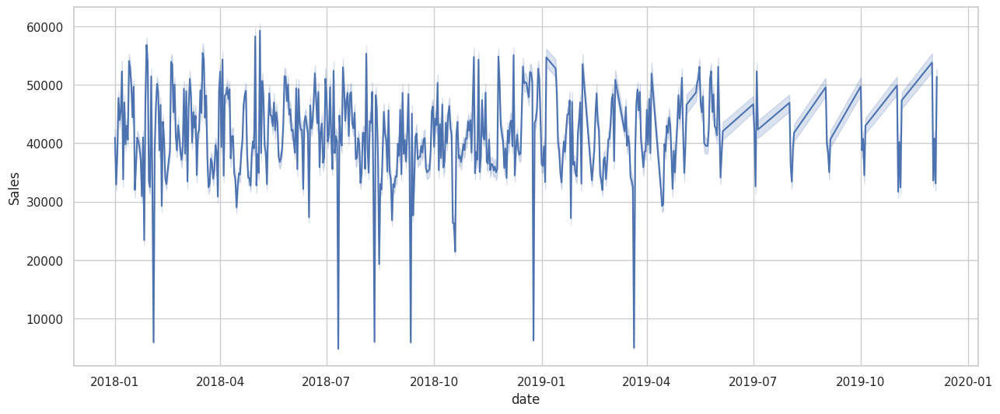

In [49]:
plt.figure(figsize=(15, 6))
sns.lineplot(x = d['date'],y = d['Sales'])

#### Interpolating values to remove zeros

In [50]:
# Check for zeros in the actual data
print(d['Sales'].isnull().sum())
print((d['Sales'] == 0).sum())


0
19


In [51]:
# Replace zero or NaN values
d['Sales'] = d['Sales'].replace(0, np.nan).interpolate()


In [52]:
print(d['Sales'].isnull().sum())
print((d['Sales'] == 0).sum())

0
0


### Data Transformation

In [53]:
#Dropping unnecessary columns

d.drop(columns = ['ID'],inplace = True)

In [54]:
#one hot encoding

d['Location_Type'] = d['Location_Type'].map({'L1':0,'L2':1,'L3':2,'L4':3,'L5':4})
d['Store_Type'] = d['Store_Type'].map({'S1':0,'S2':1,'S3':2,'S4':3})
d['Region_Code'] = d['Region_Code'].map({'R1':0,'R2':1,'R3':2,'R4':3})

#### Standardization

In [56]:
#Standardization

from sklearn.preprocessing import StandardScaler,MinMaxScaler

scaler = MinMaxScaler()

d[['Sales_transformed','past_7_days_sales']] = scaler.fit_transform(d[['Sales','past_7_days_sales']])

d.head()

,Store_id,Store_Type,Location_Type,Region_Code,date,Holiday,Discount,#Order,Sales,day,...,week_of_month,week_of_year,day_of_week,year,is_wknd,quarter,season,past_7_days_sales,avg_orders_per_store,Sales_transformed
0,1,0,2,0,2018-01-01,1,1,9,7011.84,1,...,1,1,1,2018,0,1,0,0.000000,79.90411,0.075565
1,253,3,1,0,2018-01-01,1,1,60,51789.12,1,...,1,1,1,2018,0,1,0,0.036046,79.90411,0.612329
2,252,2,1,0,2018-01-01,1,1,42,36868.20,1,...,1,1,1,2018,0,1,0,0.024034,79.90411,0.433466
3,251,1,2,0,2018-01-01,1,1,23,19715.16,1,...,1,1,1,2018,0,1,0,0.010226,79.90411,0.227845
4,250,1,2,3,2018-01-01,1,1,62,45614.52,1,...,1,1,1,2018,0,1,0,0.031075,79.90411,0.538311


In [57]:
d.shape

(188340, 23)

Seperating Discount as an exogenous variable

In [58]:
exog_discount = d[['date','Discount']]

Seperating holiday as exogenous variable

In [59]:
exog_holiday = d[['date','Holiday']]

Forming data for time series models  

In [60]:
sales_df = d[['date','Sales']]
sales_df.head()

,date,Sales
0,2018-01-01,7011.84
1,2018-01-01,51789.12
2,2018-01-01,36868.20
3,2018-01-01,19715.16
4,2018-01-01,45614.52


In [61]:
sales_df.shape

(188340, 2)

set date as index

In [62]:
sales_df.set_index('date',inplace=True)

### Checking Stationarity of Data

In [63]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [64]:
from statsmodels.tsa.stattools import adfuller

def adf_test(timeseries):
    print (f'Results of Dickey-Fuller Test')
    dftest = adfuller(timeseries, autolag='AIC')
    print("Test statistic = {:.3f}".format(dftest[0]))
    print("P-value = {:.3f}".format(dftest[1]))
    print("Critical values :")

    for key, value in dftest[4].items():
        print("\t{}: {} - The data is {} stationary with {}% confidence".format(key, value, '' if dftest[0] < value else 'not', 100-int(key[:-1])))

    # Autocorrelation Plots
    fig, ax = plt.subplots(2, figsize=(14,7))
    ax[0] = plot_acf(timeseries, ax=ax[0], lags=20)
    ax[1] = plot_pacf(timeseries, ax=ax[1], lags=20)
    print('-' * 80)

Results of Dickey-Fuller Test
Test statistic = -13.325
P-value = 0.000
Critical values :
	1%: -3.430384736130366 - The data is  stationary with 99% confidence
	5%: -2.8615553529047295 - The data is  stationary with 95% confidence
	10%: -2.5667781718001312 - The data is  stationary with 90% confidence
--------------------------------------------------------------------------------


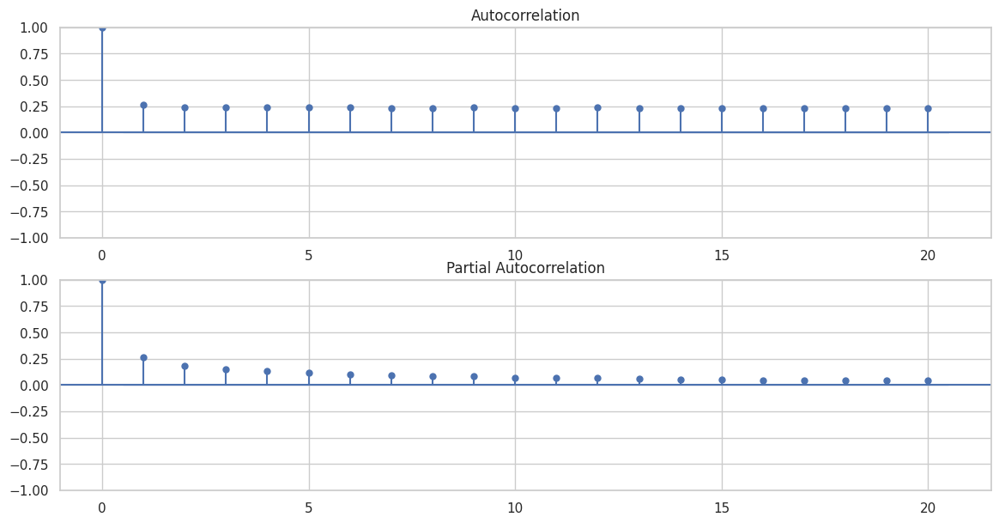

In [65]:
adf_test(sales_df)

**Inference** : From the above dicky fuller test we can observe that p value is very small and less than 5% . So we can conclude that the time series is stationary

### Time Series Decomposition

In [66]:
from statsmodels.tsa.seasonal import seasonal_decompose

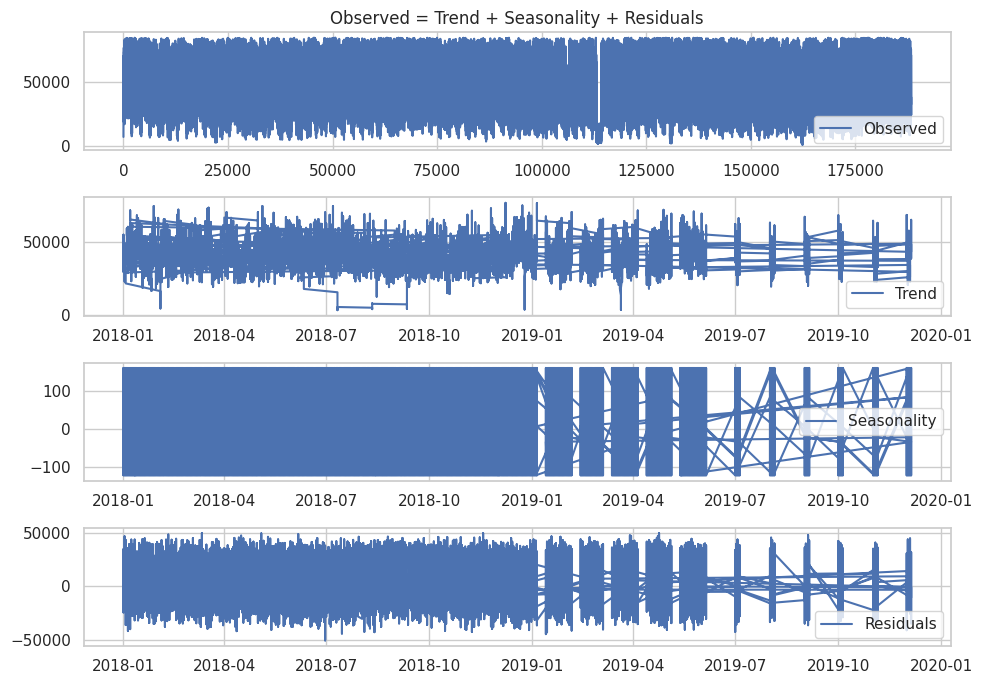

In [67]:
#Considering weekly seasonality period is set to 7
decomposition_df = seasonal_decompose(sales_df, model='additive', period=7)


trend = decomposition_df.trend
seasonal = decomposition_df.seasonal
residual = decomposition_df.resid

plt.figure(figsize=(10,7))
plt.subplot(411)
plt.title('Observed = Trend + Seasonality + Residuals')
plt.plot(sales_df['Sales'].values,label='Observed')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal,label='Seasonality')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residuals')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

Caculating the first difference to determine p,q,d values

Results of Dickey-Fuller Test
Test statistic = -75.570
P-value = 0.000
Critical values :
	1%: -3.430384736314882 - The data is  stationary with 99% confidence
	5%: -2.8615553529862825 - The data is  stationary with 95% confidence
	10%: -2.566778171843539 - The data is  stationary with 90% confidence
--------------------------------------------------------------------------------


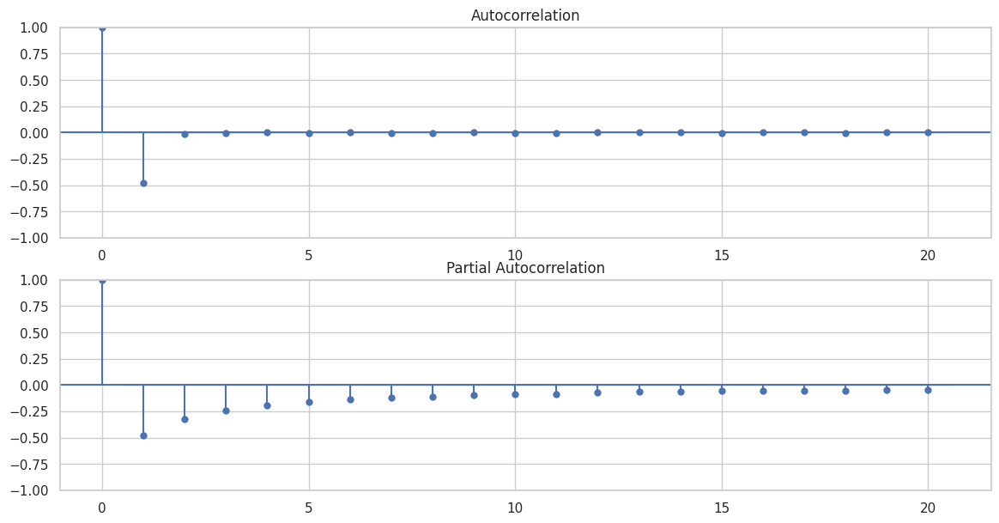

In [68]:
first_difference = sales_df.Sales - sales_df.Sales.shift(1)
first_difference = pd.DataFrame(first_difference.dropna(inplace=False))
# Check for stationarity after differencing
adf_test(first_difference.Sales)

Interpreting the p, q, d values

* We are considering the first order difference d = 1
* From the PACF Plot p = 1
* From the ACF Plot we can observe a sharp cut off at lag 1 , therefore we can use MA(q)=1

### ARIMA Model

In [69]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
warnings.filterwarnings('ignore')

In [70]:
# Pipeline for ARIMA Model

def arima_model_pipeline(series,p,q,d):
  arima_model = ARIMA(series, order=(p, q, d)).fit()


  # Forecast the next 10 steps
  forecast_steps = 10
  series = series.Sales
  forecast = arima_model.forecast(steps=forecast_steps)
  forecast_index = pd.date_range(start=series.index[-1], periods=forecast_steps + 1, freq='MS')[1:]  # Monthly frequency

  # Converting forecast to a DataFrame
  forecast_df = pd.DataFrame({
      "Forecast": forecast.values
  }, index=forecast_index)

  #Model evaluation
  mse = mean_squared_error(series[-forecast_steps:], forecast)
  mae = mean_absolute_error(series[-forecast_steps:], forecast)
  mape = mean_absolute_percentage_error(series[-forecast_steps:], forecast)
  rmse = np.sqrt(mse)
  print("RMSE :",rmse)
  print("MAPE :",mape)
  print("Mean Squared Error (MSE):", mse)
  print("Mean Absolute Error (MAE):", mae)

  # Plotting the actual data
  plt.figure(figsize=(12, 6))
  plt.plot(series, label="Actual Data", color="blue")

  # Plotting the forecast
  plt.plot(forecast_df, label="Forecast", color="red", linestyle="--")


  plt.title("ARIMA Forecast")
  plt.xlabel("Date")
  plt.ylabel("Sales")
  plt.legend()
  plt.show()

  return arima_model

RMSE : 16664.249396690826
MAPE : 0.9490072021695963
Mean Squared Error (MSE): 277697207.9551106
Mean Absolute Error (MAE): 15821.344900932843


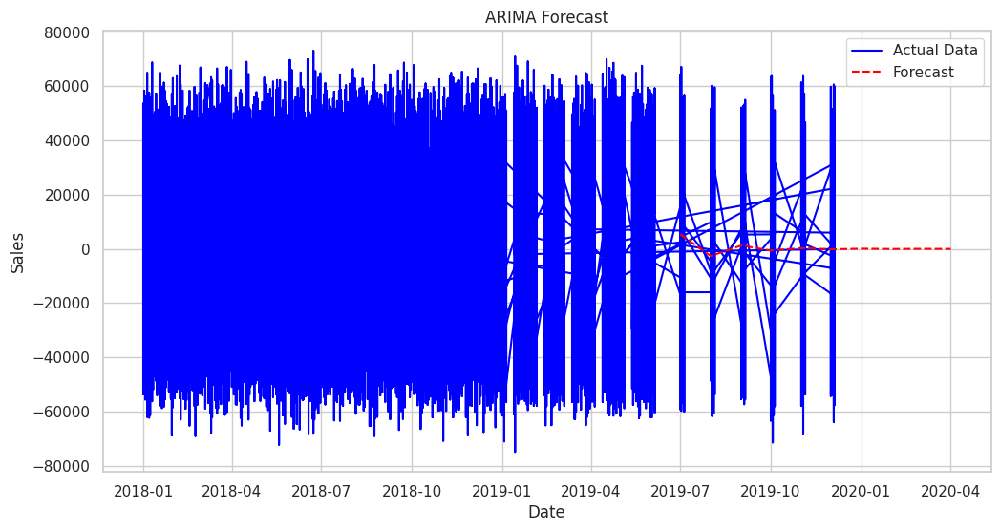

In [71]:
arima_model = arima_model_pipeline(first_difference,1,1,1)

### SARIMA Model

In [72]:
def sarimax_model(time_series, n_forecast=30, p=0, d=0, q=0, P=0, D=0, Q=0, s=0, exog=None):
    # Ensure exog aligns with the series
    if exog is not None:
        exog = exog.reindex(time_series.index)

    # Fit the SARIMAX model
    model = SARIMAX(
        time_series[:300],
        order=(p, d, q),
        seasonal_order=(P, D, Q, s),
        exog=exog.iloc[:300] if exog is not None else None,
        initialization='approximate_diffuse',
    )
    model_fit = model.fit()

    # Prepare exog for forecasting
    exog_forecast = None
    if exog is not None:
        exog_forecast = exog.iloc[-n_forecast:]
        if exog_forecast.shape[0] != n_forecast:
            # Adjust exog_forecast to match n_forecast
            exog_forecast = exog.iloc[-1:].values.repeat(n_forecast, axis=0)

    # Forecasting the next n values
    model_forecast = model_fit.forecast(n_forecast, exog=exog_forecast)

    # Plotting the results
    plt.figure(figsize=(20, 8))
    plt.plot(time_series[300:], label='Actual')
    plt.plot(time_series[:300], label='Training')
    plt.plot(pd.Series(model_forecast, index=time_series.index[-n_forecast:]), label='Forecast')
    plt.legend(loc="upper right")
    plt.title(f'SARIMAX Model ({p},{d},{q}) ({P},{D},{Q},{s}) : Actual vs Forecasts', fontsize=15, fontweight='bold')
    plt.show()

    # Calculate errors
    actuals = time_series.values[300:]
    errors = model_forecast.values - actuals[:n_forecast]

    mape = np.mean(np.abs(errors) / np.abs(actuals[:n_forecast]))
    rmse = np.sqrt(np.mean(errors ** 2))

    # Print metrics
    print('-' * 80)
    print(f'MAPE of Model : {np.round(mape, 5)}')
    print('-' * 80)
    print(f'RMSE of Model : {np.round(rmse, 3)}')
    print('-' * 80)

    return model_fit

In [73]:
exog_df = exog_discount.copy()
exog_df.set_index('date',inplace=True)

In [74]:

s = first_difference.Sales
# Check and remove duplicate indices in exog_df
if s.index.duplicated().sum() > 0:
    series = s[~s.index.duplicated(keep='first')]

# Check and remove duplicate indices in exog_df
if exog_df.index.duplicated().sum() > 0:
    exog_df = exog_df[~exog_df.index.duplicated(keep='first')]

# Align exog_df with series
exog_df = exog_df.reindex(series.index)

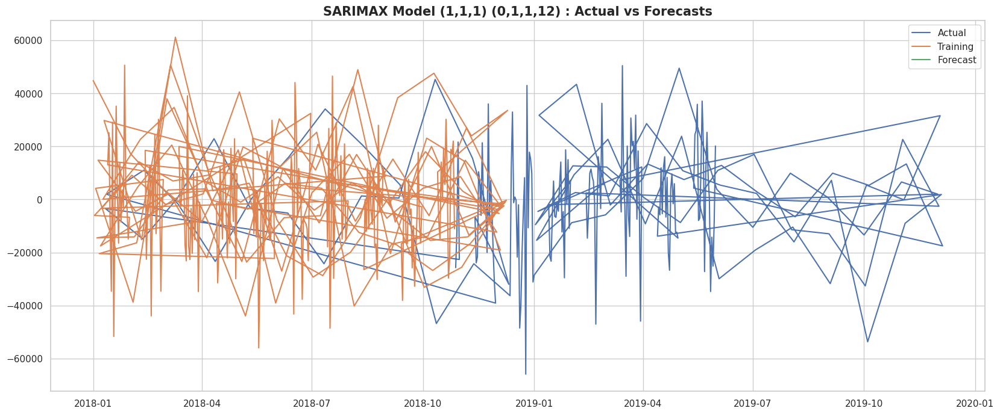

--------------------------------------------------------------------------------
MAPE of Model : 16.42532
--------------------------------------------------------------------------------
RMSE of Model : 20797.919
--------------------------------------------------------------------------------


In [75]:
fitted_sarimax_model = sarimax_model(series, n_forecast=30, p=1, d=1, q=1, P=0, D=1, Q=1, s=12, exog=exog_df)

In [76]:
exog_holiday.set_index('date',inplace=True)

exog_df2 = exog_holiday.copy()

if exog_df2.index.duplicated().sum() > 0:
    exog_df2 = exog_df2[~exog_df2.index.duplicated(keep='first')]

# Align exog_df with series
exog_df2 = exog_df2.reindex(series.index)

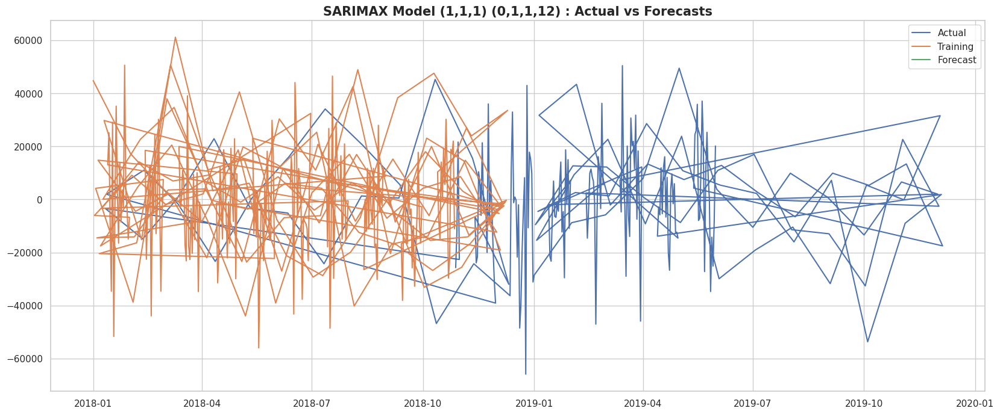

--------------------------------------------------------------------------------
MAPE of Model : 45.14567
--------------------------------------------------------------------------------
RMSE of Model : 45077.655
--------------------------------------------------------------------------------


In [77]:
fitted_sarimax_model_1 = sarimax_model(series, n_forecast=30, p=1, d=1, q=1, P=0, D=1, Q=1, s=12, exog=exog_df2)

In [78]:
sales_df.head()

,Sales
date,
2018-01-01,7011.84
2018-01-01,51789.12
2018-01-01,36868.20
2018-01-01,19715.16
2018-01-01,45614.52


### Prophet

In [79]:
ts = d[['date','Sales']]
ts.columns = ['ds','y']
ts.head()

,ds,y
0,2018-01-01,7011.84
1,2018-01-01,51789.12
2,2018-01-01,36868.20
3,2018-01-01,19715.16
4,2018-01-01,45614.52


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpqmypovoi/_0_wug_n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpqmypovoi/blr59co2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45986', 'data', 'file=/tmp/tmpqmypovoi/_0_wug_n.json', 'init=/tmp/tmpqmypovoi/blr59co2.json', 'output', 'file=/tmp/tmpqmypovoi/prophet_model92jpfqwv/prophet_model-20250126154618.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
15:46:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:47:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


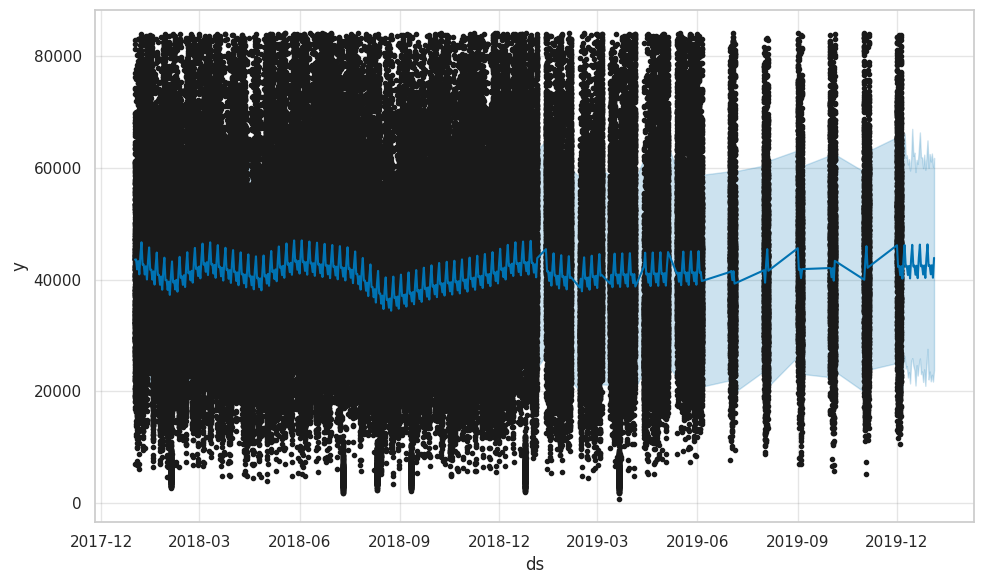

In [80]:
#prophet
from prophet import Prophet

prophet1 = Prophet(weekly_seasonality=True)
prophet1.fit(ts[['ds', 'y']][:-30])
future = prophet1.make_future_dataframe(periods=30, freq= 'D')
forecast = prophet1.predict(future)
fig1 = prophet1.plot(forecast)

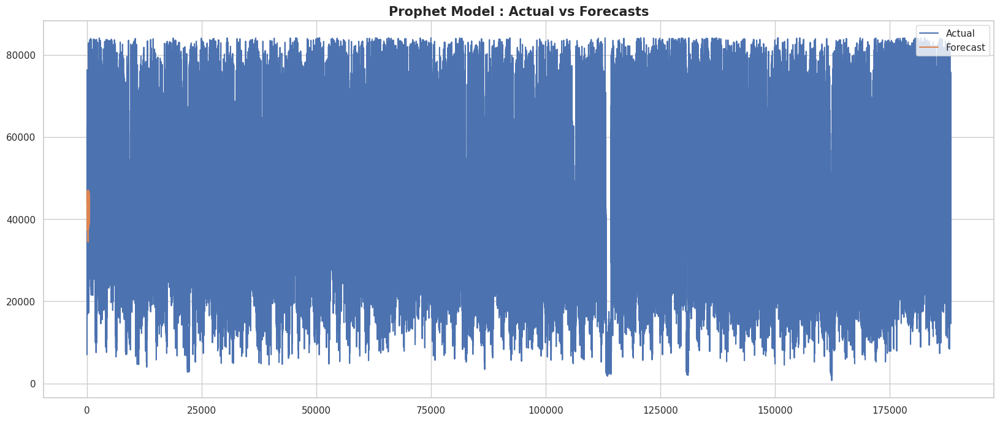

In [81]:
actual = ts['y'].values
forecast_values =  forecast['yhat'].values

plt.figure(figsize=(20, 8))
plt.plot(actual, label='Actual')
plt.plot(forecast_values, label='Forecast')
plt.legend(loc="upper right")
plt.title(f'Prophet Model : Actual vs Forecasts', fontsize=15, fontweight='bold')
plt.show()

In [82]:
aligned_data = pd.merge(forecast[['ds', 'yhat']], ts, on='ds', how='inner')


actual = aligned_data['y'].values
forecast_values = aligned_data['yhat'].values

#Calculate errors and MAPE
errors = abs(actual - forecast_values)
mape = np.mean(errors / abs(actual))
rmse  = np.sqrt(np.mean(errors ** 2))

print('-' * 80)
print('RMSE:', rmse)
print('-' * 80)
print('MAPE:', mape)
print('-' * 80)

--------------------------------------------------------------------------------
RMSE: 15015.69353047566
--------------------------------------------------------------------------------
MAPE: 0.4161858597366931
--------------------------------------------------------------------------------


### Regression

In [83]:
rg_df = d.copy()

In [84]:
d.date.max()

Timestamp('2019-12-05 00:00:00')

In [85]:
d.date.min()

Timestamp('2018-01-01 00:00:00')

In [86]:
rg_df.drop(columns=['Store_id','Sales_transformed','#Order','day_of_month','day_of_year','week_of_month','week_of_year','quarter','past_7_days_sales','avg_orders_per_store'],inplace=True)
rg_df.set_index('date',inplace=True)

In [87]:
rg_df.head()

,Store_Type,Location_Type,Region_Code,Holiday,Discount,Sales,day,month,day_of_week,year,is_wknd,season
date,,,,,,,,,,,,
2018-01-01,0,2,0,1,1,7011.84,1,1,1,2018,0,0
2018-01-01,3,1,0,1,1,51789.12,1,1,1,2018,0,0
2018-01-01,2,1,0,1,1,36868.20,1,1,1,2018,0,0
2018-01-01,1,2,0,1,1,19715.16,1,1,1,2018,0,0
2018-01-01,1,2,3,1,1,45614.52,1,1,1,2018,0,0


#### Linear Regression

In [88]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression


In [89]:
rg_df.shape

(188340, 12)

In [90]:
reg_train_df = rg_df.iloc[:150000]
reg_validation_df = rg_df.iloc[150000:]

Train Test Split

In [91]:
X_train = reg_train_df.drop('Sales', axis=1)
y_train = reg_train_df['Sales']

X_test = reg_validation_df.drop('Sales', axis=1)
y_test = reg_validation_df['Sales']

Selecting the Top Features

In [92]:
from sklearn.feature_selection import SelectKBest, f_regression

In [93]:
top_features = SelectKBest(score_func=f_regression, k=5)
fit = top_features.fit(X_train, y_train)

In [94]:
df_scores = pd.DataFrame(fit.scores_)
df_columns = pd.DataFrame(X_train.columns)

feature_scores = pd.concat([df_columns, df_scores], axis=1)
feature_scores.columns = ['Feature','Score']
print(feature_scores.nlargest(5,'Score'))

         Feature         Score
0     Store_Type  39186.831939
1  Location_Type  18823.360562
4       Discount  18744.834216
3        Holiday   5290.700154
2    Region_Code   1193.943409


In [95]:
#pipleline for linear regression
def linearregression(trainx,trainy,testx,testy):
  model = LinearRegression()
  model.fit(trainx, trainy)

  y_pred = model.predict(testx)

  mape = np.mean(np.abs((y_pred - testy) / y_test)) * 100
  rmse = np.sqrt(mean_squared_error(testy, y_pred))

  print(f'MAPE: {mape:.2f}%')
  print(f'RMSE: {rmse:.2f}')
  return y_pred,model



In [96]:
#Keeping all the features

preds,linear_regression_model=linearregression(X_train,y_train,X_test,y_test)

MAPE: 29.76%
RMSE: 11893.64


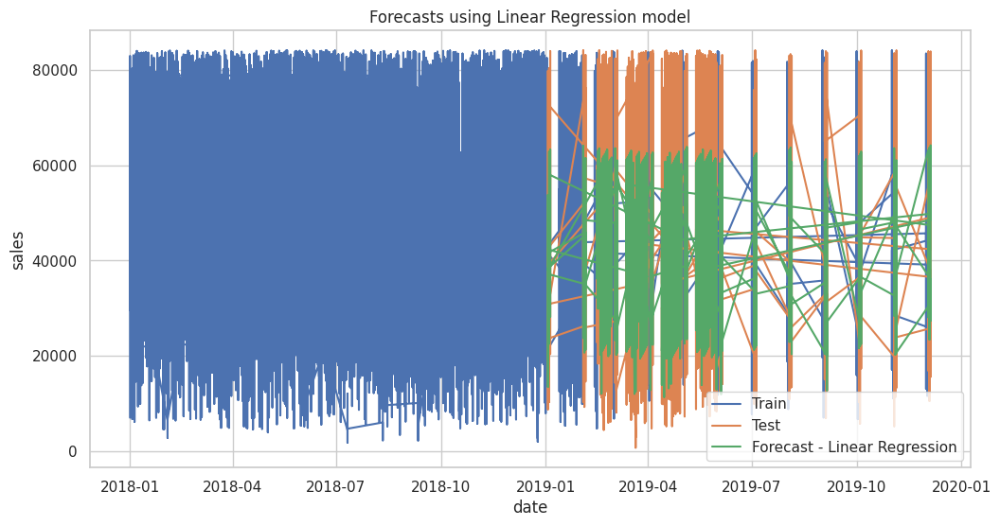

In [97]:
errors_df = reg_validation_df[['Sales']]
errors_df['pred_sales'] = preds
errors_df['errors'] = preds - y_test
errors_df.insert(0, 'model', 'LinearRegression')


plt.plot(reg_train_df.index, reg_train_df['Sales'], label='Train')
plt.plot(reg_validation_df.index, reg_validation_df['Sales'], label='Test')
plt.plot(errors_df.index, errors_df['pred_sales'], label='Forecast - Linear Regression')
plt.legend(loc='best')
plt.xlabel('date')
plt.ylabel('sales')
plt.title('Forecasts using Linear Regression model')
plt.show()

In [98]:
#considering the best 5 features for linear regression

X_train_best_5 = X_train[['Store_Type','Location_Type','Discount','Holiday','Region_Code']]
X_test_best_5 = X_test[['Store_Type','Location_Type','Discount','Holiday','Region_Code']]

Pred_with_best_5 = linearregression(X_train_best_5,y_train,X_test_best_5,y_test)

MAPE: 29.45%
RMSE: 11943.36


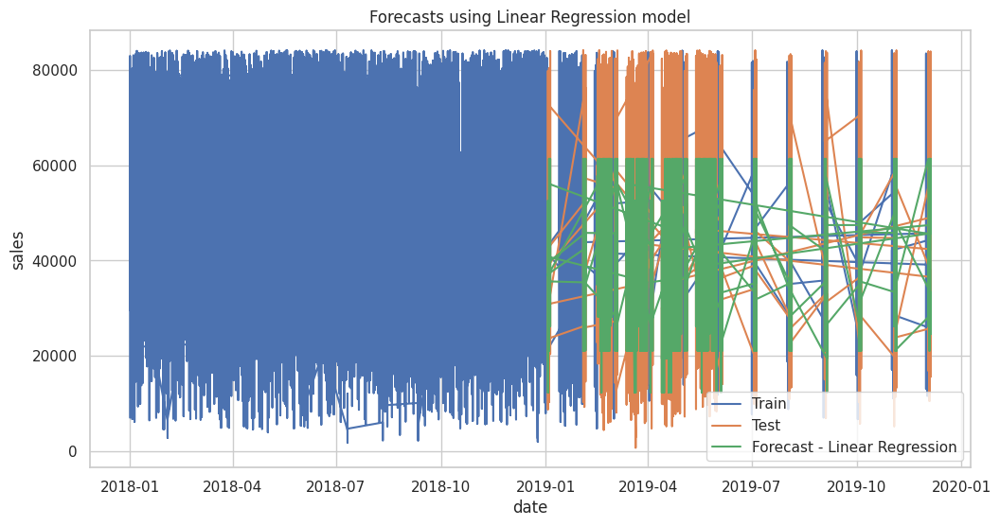

In [99]:
errs_df_b5 = reg_validation_df[['Sales']]
errs_df_b5['pred_sales'] = Pred_with_best_5[0]
errs_df_b5['errors'] = Pred_with_best_5[0] - y_test
errs_df_b5.insert(0, 'model', 'LinearRegression')

plt.plot(reg_train_df.index, reg_train_df['Sales'], label='Train')
plt.plot(reg_validation_df.index, reg_validation_df['Sales'], label='Test')
plt.plot(errs_df_b5.index, errs_df_b5['pred_sales'], label='Forecast - Linear Regression')
plt.legend(loc='best')
plt.xlabel('date')
plt.ylabel('sales')
plt.title('Forecasts using Linear Regression model')
plt.show()

#### Ensemble Methods

In [100]:
from sklearn.model_selection import  GridSearchCV,RandomizedSearchCV

In [101]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor


# Function to evaluate models and find the best one
def run_models_pipeline(X_train, X_test, y_train, y_test):
    models = {
        "Decision Tree": DecisionTreeRegressor(random_state=42),
        "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
        "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, random_state=42)
    }

    results = {}
    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        mape = mean_absolute_percentage_error(y_test, y_pred)
        results[name] = mape
        print(f"{name} MAPE: {mape:.2%}")

    best_model_name = min(results, key=results.get)
    best_model = models[best_model_name]

    print(f"\nBest Performing Model: {best_model_name} with MAPE: {results[best_model_name]:.2%}")
    return best_model, best_model_name




In [102]:
#Function to fine-tune the parameters of the best-performing model
def fine_tune_model(model, param_grid, X_train, y_train):
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=2, scoring='neg_mean_absolute_percentage_error', verbose=1, n_jobs=-1)
    grid_search.fit(X_train, y_train)

    print("\nBest Parameters:")
    print(grid_search.best_params_)

    print("\nBest CV Score (MAPE): {:.2%}".format(-grid_search.best_score_))
    return grid_search.best_estimator_

In [103]:
def fine_tune_model_quickly(model, param_grid, X_train, y_train, n_iter=20):
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grid,
        n_iter=n_iter,  # Number of random parameter combinations to try
        cv=2,  # Reduce folds to speed up
        scoring='neg_mean_absolute_percentage_error',
        verbose=1,
        n_jobs=-1,
        random_state=42
    )
    random_search.fit(X_train, y_train)

    print("\nBest Parameters:")
    print(random_search.best_params_)

    print("\nBest CV Score (MAPE): {:.2%}".format(-random_search.best_score_))
    return random_search.best_estimator_

In [104]:
best_model, best_model_name = run_models_pipeline(X_train, X_test, y_train, y_test)

Decision Tree MAPE: 32.10%
Random Forest MAPE: 29.21%
Gradient Boosting MAPE: 26.28%

Best Performing Model: Gradient Boosting with MAPE: 26.28%


In [105]:
best_model_name

'Gradient Boosting'

In [106]:
# Define hyperparameter grid based on the best model
if best_model_name == "Decision Tree":
    param_grid = {
        "max_depth": [3, 5, 10, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    }
elif best_model_name == "Random Forest":
    param_grid = {
    "n_estimators": [50, 100, 150],
    "max_depth": [10, 15, 20, None],
    "min_samples_split": [2, 5],
    }

elif best_model_name == "Gradient Boosting":
    param_grid = {
        "n_estimators": [50, 100, 200],
        "learning_rate": [0.01, 0.1, 0.2],
        "max_depth": [3, 5, 10],
        "min_samples_split": [2, 5, 10]
    }

# Fine-tune the model
best_tuned_model = fine_tune_model_quickly(best_model, param_grid, X_train, y_train)


Fitting 2 folds for each of 20 candidates, totalling 40 fits

Best Parameters:
{'n_estimators': 200, 'min_samples_split': 10, 'max_depth': 3, 'learning_rate': 0.1}

Best CV Score (MAPE): 26.78%


Since the tuned model MAPE is more than that of the basic model we ll be using th ebase model for predictions

In [107]:
def calculate_rmse(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    return rmse

In [108]:
print(f"RMSE for {best_model_name}: {calculate_rmse(best_model, X_test, y_test)}")

RMSE for Gradient Boosting: 10850.50495115032


Saving the best model

In [109]:
import pickle
with open('best_model.pkl', 'wb') as f:
    pickle.dump(best_model, f)

In [152]:
df_test = pd.read_csv('TEST_FINAL.csv')
df_test.date = pd.to_datetime(df_test.Date,format='mixed')
df_test.head()

,ID,Store_id,Store_Type,Location_Type,Region_Code,Date,Holiday,Discount
0,T1188341,171,S4,L2,R3,01-06-2019,0,No
1,T1188342,172,S1,L1,R1,01-06-2019,0,No
2,T1188343,173,S4,L2,R1,01-06-2019,0,No
3,T1188344,174,S1,L1,R4,01-06-2019,0,No
4,T1188345,170,S1,L1,R2,01-06-2019,0,No


In [160]:
def encode_data(df):
    df['date'] = pd.to_datetime(df['Date'],format='mixed')
    df['day'] = df['date'].dt.day
    df['month'] = df['date'].dt.month
    df['day_of_week'] = df['date'].dt.dayofweek
    df['year'] = df['date'].dt.year
    df['is_wknd'] = df['day_of_week'].apply(lambda x: 1 if (x == 5 or x == 6) else 0)
    df['season'] = df['month'].map({1: 1, 2: 1, 3: 1, 4:2, 5:2, 6:2, 7:3, 8:3, 9:3, 10:4, 11:4, 12:4})
    df['Store_Type'] = df['Store_Type'].map({'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4})
    df['Location_Type'] = df['Location_Type'].map({'L1': 1, 'L2': 2, 'L3': 3, 'L4': 4})
    df['Region_Code'] = df['Region_Code'].map({'R1': 1, 'R2': 2, 'R3': 3, 'R4': 4})
    df['Discount'] = df['Discount'].map({'Yes': 1, 'No':0})
    df.drop(columns=['ID','Store_id','Date'],inplace=True)
    df.set_index('date',inplace=True)
    df.dropna(inplace=True)
    return df

In [154]:
test_data = encode_data(df_test)

In [155]:
test_data.head()

,Store_Type,Location_Type,Region_Code,Holiday,Discount,day,month,day_of_week,year,is_wknd,season
date,,,,,,,,,,,
2019-01-06,4,2.0,3,0,0,6,1,6,2019,1,1
2019-01-06,1,1.0,1,0,0,6,1,6,2019,1,1
2019-01-06,4,2.0,1,0,0,6,1,6,2019,1,1
2019-01-06,1,1.0,4,0,0,6,1,6,2019,1,1
2019-01-06,1,1.0,2,0,0,6,1,6,2019,1,1


In [156]:
prediction = best_model.predict(test_data)
prediction

array([47793.56154325, 42095.95891863, 48630.97477285, ...,
       45028.81011552, 37818.62880062, 44605.91944716])

In [158]:
test_data['sales_predicted'] = prediction

<Axes: xlabel='date', ylabel='sales_predicted'>

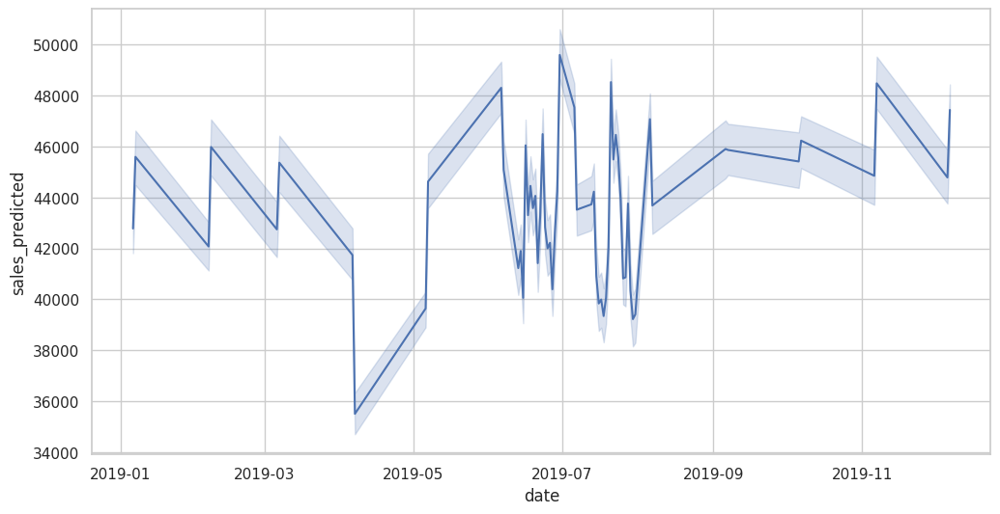

In [159]:
sns.lineplot(data=test_data,x=test_data.index,y='sales_predicted')

## Model Performance Metrics

| Model                | MAPE (%)      | RMSE          |
|----------------------|---------------|---------------|
| ARIMA               | 0.949        | 16664.24       |
| SARIMA              | 16.425         | 20797.91        |
| Prophet             | 0.416        | 15015.69        |
| Linear Regression   | 29.45         | 11945.36        |
| Gradient Boosting   | 26.28          | 10850.51        |


I'll be considering  Gradient Boosting because it has the lowest RMSE (10850.51), demonstrating its accuracy in minimizing prediction errors, which is crucial for reliable forecasting. Its MAPE (26.28%) is competitive and strikes a good balance between error magnitude and percentage accuracy. Gradient Boosting's ability to capture complex patterns and interactions makes it better suited for handling the intricacies of the data compared to ARIMA or SARIMA. Furthermore, it generalizes well for future predictions, offering a dependable solution with consistent performance.

## **Insights**


1. **Skewed Sales Distribution**: The sales distribution is right-skewed, indicating that most transactions have lower values, while a smaller portion has significantly high sales.

2. **Location Dominance**: Location Type L1 and Region Code R1 dominate sales, suggesting these categories are critical for the business’s revenue.

3. **Non-Holiday Sales Focus**: Most sales occur during non-holidays and without discounts, reflecting a business strategy not reliant on promotions or holiday campaigns.

4. **Underperforming Categories**: Categories like L4, L5, and R4 have significantly lower sales and may require deeper analysis or targeted interventions.

5. **Sales Density**: Non-holiday periods show a uniform and dense spread in sales, whereas holidays have sporadic occurrences with lower density, suggesting fewer holidays in the dataset.

6. **Store Performance**: Median sales are highest in store type S4, while store type S2 has the lowest median sales, indicating performance variability among store types.

7. **Day-wise Sales Patterns**: Sales are consistent for the first four days of the week, drop on day 5, and rise over the weekend, where median sales are the highest.

8. **Monthly Sales Trends**: Sales peak on the first day of each month, showing a distinct pattern tied to the start of the month.

9. **Seasonal Sales Trends**: The highest sales occur in May and June, followed by a sharp decline between June and August, hitting a low in September before increasing steadily towards the year-end.

10. **Regional Consistency**: Median sales are consistent across regions, though R1 and R3 show broader variability and a significant number of outliers with exceptionally high sales.

11. **Discount Impact**: Discounts have the strongest positive correlation with sales, indicating that promotional offers effectively boost revenue.

12. **Holiday Impact**: Holidays have a weaker positive correlation with sales, suggesting a minor but positive effect on sales performance.

13. **Sales Over Time**: A noticeable upward trend in sales starts around mid-2019, peaking in early 2020, indicating growth in the business over time.

14. **Seasonal Consistency**: Sales remain consistent across all four seasons, with minimal variation, suggesting the business does not depend heavily on seasonality.

15. **Outlier Regions**: R1 exhibits the highest sales outliers, including instances exceeding 250k, suggesting potential high-performing locations within this region.


## **Recommendations**

#### **Seasonality and Sales Patterns**  
* **Identify Seasonal Peaks**: Plan for increased inventory during high-sales months like May and June to avoid stockouts.  
* **Address Seasonal Declines**: Mitigate the sharp drop in sales between June and September with seasonal discounts, new product launches, or targeted marketing campaigns.  
* **Capitalize on Year-End Trends**: Boost inventory during the recovery months (October to December) to leverage end-of-year festive seasons and promotions.  
* **Weekly Trends**: Stock higher inventory for weekends and the first day of the month, as these days see higher median sales.  

#### **Region-Specific Strategies**  
* **Focus on R1**: Allocate more inventory and marketing resources to Region R1 due to its high sales range and potential for significant revenue.  
* **Optimize R4 Stability**: Tailor inventory strategies for Region R4, which shows stable sales patterns, reducing overstock risks.  
* **Expand High-Performing Regions**: Analyze and replicate successful strategies from R1 and R3 to improve performance in other regions.  

#### **Store Type Optimization**  
* **Prioritize S4 and S1**: Increase inventory and promotional efforts in Store Types S4 and S1, which show higher sales counts and median values.  
* **Revamp S2 Strategies**: Investigate low performance in Store Type S2 and implement tailored strategies like better product selection or promotions.  

#### **Promotions and Discounts**  
* **Leverage Discounts**: Use discount campaigns strategically, as discounts have a strong positive correlation with sales.  
* **Non-Holiday Sales Opportunities**: Focus on non-holiday periods, where the majority of sales occur, by offering consistent product availability and targeted promotions.  
* **Holiday Campaigns**: Although holidays have a weaker correlation with sales, plan localized or holiday-specific promotions to maximize potential gains.  

#### **Inventory Planning**  
* **Outlier Analysis**: Investigate instances of exceptionally high sales (outliers) to identify factors contributing to success and adapt inventory to match similar opportunities.  
* **Avoid Overstocking**: Use consistent sales data across seasons and regions to minimize overstock risks, especially in lower-performing categories like L4, L5, and R4.  
* **Dynamic Inventory Allocation**: Allocate inventory dynamically based on weekly and monthly trends, ensuring enough stock for peak periods and reducing waste during off-peak periods.  

#### **Forecasting and Insights**  
* **Advanced Demand Forecasting**: Use the Gradient Boosting model's predictions to improve demand forecasting accuracy and adjust inventory proactively.  
* **Monitor Long-Term Trends**: Continuously monitor sales trends for shifts or changes over time, ensuring forecasting models are updated regularly for better alignment with real-world dynamics.  


